<!-- # Ross Sea synthetic gravity inversion -->

<!-- import packages -->

In [1]:
from __future__ import annotations

%load_ext autoreload
%autoreload 2

import copy
import itertools
import logging
import os
import pathlib
import pickle
import shutil

import numpy as np
import pandas as pd
import verde as vd
import xarray as xr
from polartoolkit import maps
from polartoolkit import utils as polar_utils
from tqdm.autonotebook import tqdm

import RIS_gravity_inversion.plotting as RIS_plotting
import RIS_gravity_inversion.synthetic as RIS_synth

os.environ["POLARTOOLKIT_HEMISPHERE"] = "south"

logging.getLogger().setLevel(logging.INFO)

from invert4geom import inversion, plotting, regional, utils

In [2]:
ensemble_path = "../../results/Ross_Sea_07_constraint_spacing_vs_regional_strength_ensemble_100_lims_from_all_shelves_logscale"
ensemble_fname = f"{ensemble_path}.csv"

<!-- # Get synthetic model data -->

INFO:root:converting to be reference to the WGS84 ellipsoid
INFO:root:spacing larger than original, filtering and resampling
grdsample [WARNING]: Output sampling interval in x exceeds input interval and may lead to aliasing.
grdsample [WARNING]: Output sampling interval in y exceeds input interval and may lead to aliasing.


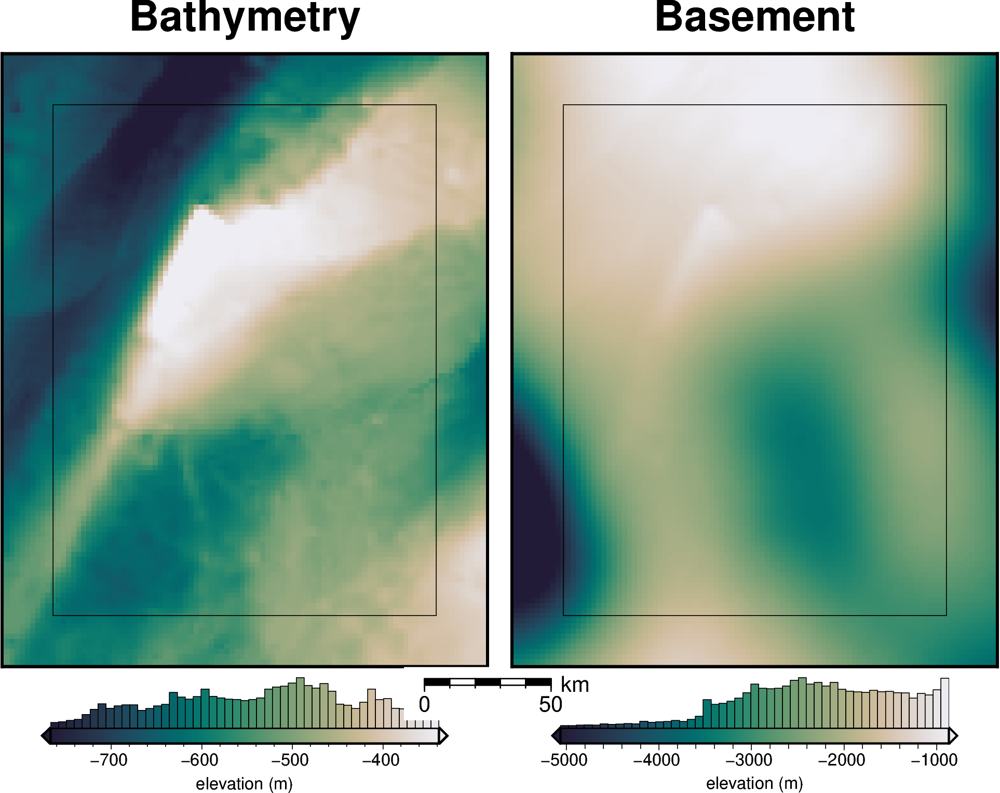

  0%|          | 0/7676 [00:00<?, ?it/s]

  0%|          | 0/7676 [00:00<?, ?it/s]

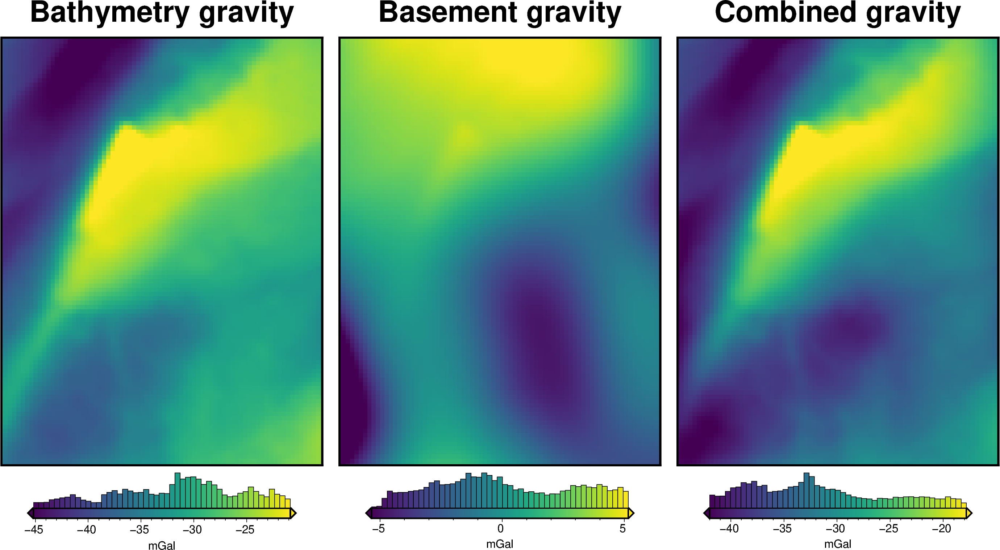

30000.0

In [3]:
# set grid parameters
spacing = 2e3
inversion_region = (-40e3, 110e3, -1600e3, -1400e3)

true_density_contrast = 1476

bathymetry, basement, original_grav_df = RIS_synth.load_synthetic_model(
    spacing=spacing,
    inversion_region=inversion_region,
    buffer=spacing * 10,
    basement=True,
    zref=0,
    bathymetry_density_contrast=true_density_contrast,
)
buffer_region = polar_utils.get_grid_info(bathymetry)[1]

inversion_area = (
    (inversion_region[1] - inversion_region[0])
    / 1e3
    * (inversion_region[3] - inversion_region[2])
    / 1e3
)
inversion_area

In [4]:
# normalize regional gravity between 0 and 1
original_grav_df["basement_grav_normalized"] = (
    vd.grid_to_table(
        utils.normalize_xarray(
            original_grav_df.set_index(["northing", "easting"])
            .to_xarray()
            .basement_grav,
            low=-1,
            high=1,
        )
    )
    .reset_index()
    .basement_grav
)
original_grav_df = original_grav_df.drop(
    columns=["basement_grav", "disturbance", "gravity_anomaly"]
)
original_grav_df

,northing,easting,upward,bathymetry_grav,basement_grav_normalized
0,-1600000.0,-40000.0,1000.0,-35.551041,-0.576200
1,-1600000.0,-38000.0,1000.0,-36.054652,-0.523887
2,-1600000.0,-36000.0,1000.0,-36.473148,-0.467097
3,-1600000.0,-34000.0,1000.0,-36.755612,-0.406792
4,-1600000.0,-32000.0,1000.0,-36.951032,-0.343951
...,...,...,...,...,...
7671,-1400000.0,102000.0,1000.0,-25.760380,0.399106
7672,-1400000.0,104000.0,1000.0,-25.911731,0.334770
7673,-1400000.0,106000.0,1000.0,-26.033127,0.268772
7674,-1400000.0,108000.0,1000.0,-26.122232,0.201841


<!-- # Set filename -->

In [5]:
num = 10

# Define total number of constraints
# of largest 100 ice shelves, the median distance to constraint points is between 1.6
# and 20 km, with a mean of 5.5 km, a 25th percentile of 2.9 km, and a 75th percentile of 6.5 km

# constraint_numbers = np.linspace(4, 80, num) # -> median distance of 35-8 km
# constraint_numbers = np.linspace(2, 60, num) #-> median distance of 50-9 km
# constraint_numbers = np.linspace(4, 100, num) #-> median distance of 35-7 km
# constraint_numbers = np.linspace(6, 400, num) #-> median distance of 28-3.5 km
# constraint_numbers = np.linspace(10, 600, num) #-> median distance of 22-3 km, linear scale
# constraint_numbers = [round(x) for x in np.geomspace(10, 600, num)] #-> median distance of 22-3 km, log scale,
# constraint_numbers = [round(x) for x in np.geomspace(10, 600, num)] #-> median distance of 13-2.5 km, log scale, w/ border
constraint_numbers = [
    round(x) for x in np.geomspace(2, 600, num - 1)
]  # -> median distance of 22.5-2.5 km, log scale, w/ border
constraint_numbers.insert(0, 0)

constraint_numbers = [round(i) for i in constraint_numbers]
assert len(pd.Series(constraint_numbers).unique()) == num

# Define regional strength
# regional_strengths = [float(round(x, 2)) for x in np.linspace(0, 50, num)]
regional_strengths = [float(round(x, 2)) for x in np.linspace(0, 150, num)]


print("number of constraints:", constraint_numbers)
print("regional strengths:", regional_strengths)

number of constraints: [0, 2, 4, 8, 17, 35, 71, 144, 294, 600]
regional strengths: [0.0, 16.67, 33.33, 50.0, 66.67, 83.33, 100.0, 116.67, 133.33, 150.0]


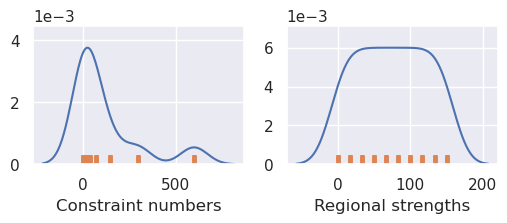

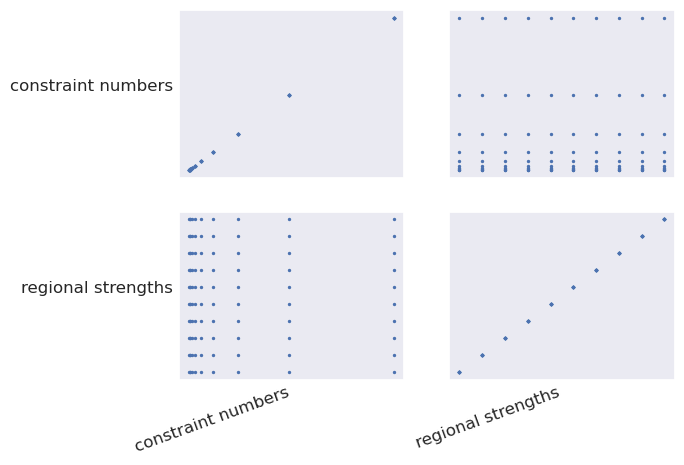

In [6]:
# turn into dataframe
sampled_params_df = pd.DataFrame(
    itertools.product(
        constraint_numbers,
        regional_strengths,
    ),
    columns=[
        "constraint_numbers",
        "regional_strengths",
    ],
)

sampled_params_dict = dict(
    constraint_numbers=dict(sampled_values=sampled_params_df.constraint_numbers),
    regional_strengths=dict(sampled_values=sampled_params_df.regional_strengths),
)

plotting.plot_latin_hypercube(
    sampled_params_dict,
)

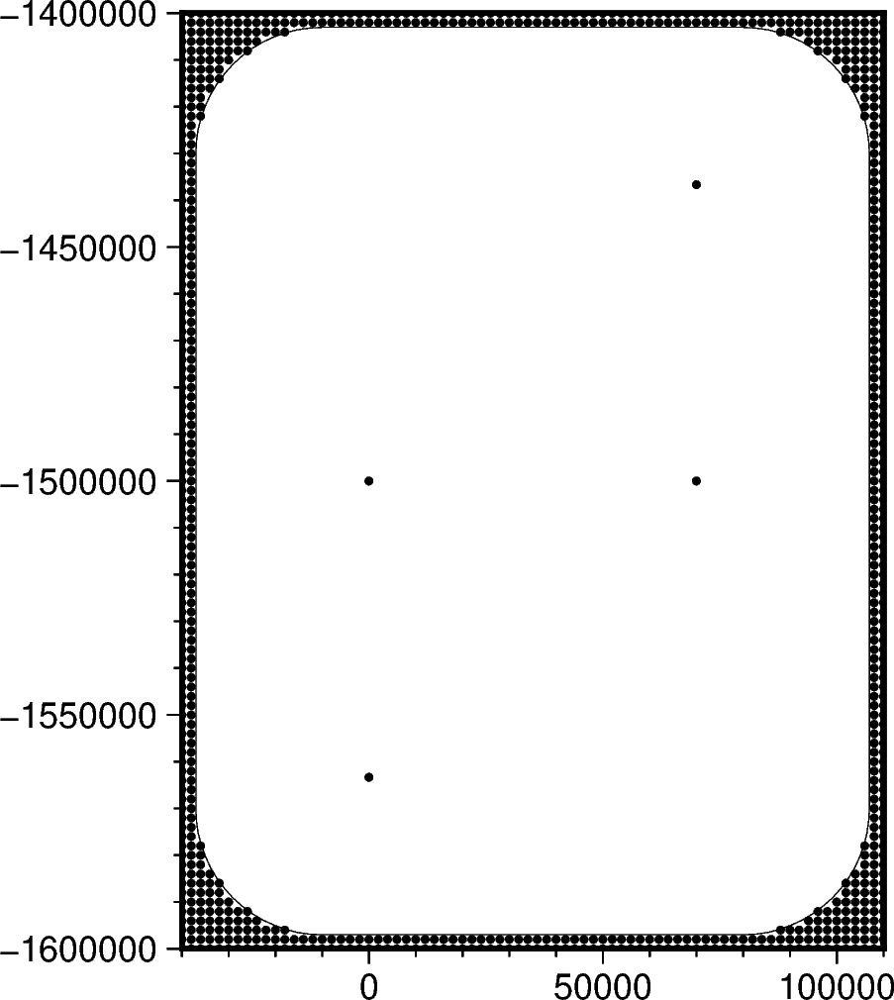

In [7]:
constraint_points = RIS_synth.constraint_layout_number(
    num_constraints=4,
    # num_constraints=600,
    region=inversion_region,
    # shift_stdev=spacing/2,
    padding=-spacing,
    # plot=True,
    # latin_hypercube=True,
    seed=10,
    shapefile="../../data/Ross_Sea_outline.shp",
    add_outside_points=True,
    grid_spacing=spacing,
    plot=True,
)

# Create starting models and constraints
Only need to do this for unique combinations of constraint_numbers and constraint_noise_levels

INFO:root:converting to be reference to the WGS84 ellipsoid
INFO:root:returning grid with new region and/or registration, same spacing


  0%|          | 0/100 [00:00<?, ?it/s]

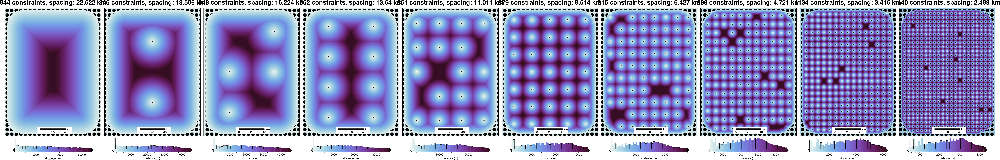

,constraint_numbers,regional_strengths,constraint_points_fname,constraint_spacing,constraints_per_10000sq_km,constraints_starting_rmse,starting_bathymetry_fname,starting_prisms_fname
0,0,0.00,../../results/Ross_Sea_07_constraint_spacing_v...,22.522,281.333333,0.000000,../../results/Ross_Sea_07_constraint_spacing_v...,../../results/Ross_Sea_07_constraint_spacing_v...
1,0,16.67,../../results/Ross_Sea_07_constraint_spacing_v...,22.522,281.333333,0.000000,../../results/Ross_Sea_07_constraint_spacing_v...,../../results/Ross_Sea_07_constraint_spacing_v...
2,0,33.33,../../results/Ross_Sea_07_constraint_spacing_v...,22.522,281.333333,0.000000,../../results/Ross_Sea_07_constraint_spacing_v...,../../results/Ross_Sea_07_constraint_spacing_v...
3,0,50.00,../../results/Ross_Sea_07_constraint_spacing_v...,22.522,281.333333,0.000000,../../results/Ross_Sea_07_constraint_spacing_v...,../../results/Ross_Sea_07_constraint_spacing_v...
4,0,66.67,../../results/Ross_Sea_07_constraint_spacing_v...,22.522,281.333333,0.000000,../../results/Ross_Sea_07_constraint_spacing_v...,../../results/Ross_Sea_07_constraint_spacing_v...
...,...,...,...,...,...,...,...,...
95,600,83.33,../../results/Ross_Sea_07_constraint_spacing_v...,2.489,480.000000,0.269469,../../results/Ross_Sea_07_constraint_spacing_v...,../../results/Ross_Sea_07_constraint_spacing_v...
96,600,100.00,../../results/Ross_Sea_07_constraint_spacing_v...,2.489,480.000000,0.269469,../../results/Ross_Sea_07_constraint_spacing_v...,../../results/Ross_Sea_07_constraint_spacing_v...
97,600,116.67,../../results/Ross_Sea_07_constraint_spacing_v...,2.489,480.000000,0.269469,../../results/Ross_Sea_07_constraint_spacing_v...,../../results/Ross_Sea_07_constraint_spacing_v...
98,600,133.33,../../results/Ross_Sea_07_constraint_spacing_v...,2.489,480.000000,0.269469,../../results/Ross_Sea_07_constraint_spacing_v...,../../results/Ross_Sea_07_constraint_spacing_v...


In [27]:
# add empty columns
# fnames to save files for each ensemble
sampled_params_df["constraint_points_fname"] = pd.Series()
# sampled_params_df["starting_bathymetry_fname"] = np.nan
# sampled_params_df["starting_prisms_fname"] = np.nan
# # rmse of the constraints
# sampled_params_df["constraints_starting_rmse"] = np.nan
# # median value of distances between each grid cell and the nearest constraint
# sampled_params_df["constraint_spacing"] = np.nan
# # number of constraints per 10,000 sq km
# sampled_params_df["constraints_per_10000sq_km"] = np.nan

starting_topography_kwargs = dict(
    method="splines",
    region=buffer_region,
    spacing=spacing,
    dampings=None,
)

# get high res grid for computing constraint spacing
bathymetry_highres, _, _ = RIS_synth.load_synthetic_model(
    spacing=500,
    just_topography=True,
)

# clip to inversion region
bathymetry_highres = bathymetry_highres.sel(
    easting=slice(inversion_region[0], inversion_region[1]),
    northing=slice(inversion_region[2], inversion_region[3]),
)

for i, row in tqdm(sampled_params_df.iterrows(), total=len(sampled_params_df)):
    # set file names
    constraint_points_fname = f"{ensemble_path}_constraint_points_{i}.csv"
    starting_bathymetry_fname = f"{ensemble_path}_starting_bathymetry_{i}.nc"
    starting_prisms_fname = f"{ensemble_path}_starting_prisms_{i}.nc"

    # check if constraint spacing is already done
    # if so, copy it
    subset_with_same_params = sampled_params_df[
        sampled_params_df.constraint_numbers == row.constraint_numbers
    ]

    if (len(subset_with_same_params) > 1) & (
        subset_with_same_params.constraint_points_fname.iloc[0] is not np.nan
    ):
        # copy and rename files
        shutil.copy(
            subset_with_same_params.constraint_points_fname.iloc[0],
            constraint_points_fname,
        )
        shutil.copy(
            subset_with_same_params.starting_bathymetry_fname.iloc[0],
            starting_bathymetry_fname,
        )
        shutil.copy(
            subset_with_same_params.starting_prisms_fname.iloc[0], starting_prisms_fname
        )

        # copy other columns
        sampled_params_df.loc[i, "constraints_starting_rmse"] = (
            subset_with_same_params.constraints_starting_rmse.iloc[0]
        )
        sampled_params_df.loc[i, "constraint_spacing"] = (
            subset_with_same_params.constraint_spacing.iloc[0]
        )
        sampled_params_df.loc[i, "constraints_per_10000sq_km"] = (
            subset_with_same_params.constraints_per_10000sq_km.iloc[0]
        )

        # print("skipping and using already created data")
    else:
        # make constraint points
        constraint_points = RIS_synth.constraint_layout_number(
            num_constraints=row.constraint_numbers,
            region=inversion_region,
            # shift_stdev=spacing/2,
            padding=-spacing,
            # plot=True,
            seed=10,
            shapefile="../../data/Ross_Sea_outline.shp",
            add_outside_points=True,
            grid_spacing=spacing,
            # latin_hypercube=True,
        )

        # sample true topography at these points
        constraint_points = utils.sample_grids(
            constraint_points,
            bathymetry,
            "true_upward",
            coord_names=("easting", "northing"),
        )
        constraint_points["upward"] = constraint_points.true_upward

        # grid the sampled values using verde
        starting_bathymetry = utils.create_topography(
            constraints_df=constraint_points,
            **starting_topography_kwargs,
        )

        # sample the inverted topography at the constraint points
        constraint_points = utils.sample_grids(
            constraint_points,
            starting_bathymetry,
            "starting_bathymetry",
            coord_names=("easting", "northing"),
        )

        constraints_rmse = utils.rmse(
            constraint_points.true_upward - constraint_points.starting_bathymetry
        )

        zref = 0
        # the true density contrast is 1476 kg/m3
        density_contrast = true_density_contrast  # 1350

        # make density grid
        density_grid = xr.where(
            starting_bathymetry >= zref,
            density_contrast,
            -density_contrast,
        )

        # create layer of prisms
        starting_prisms = utils.grids_to_prisms(
            starting_bathymetry,
            zref,
            density=density_grid,
        )

        # calculate min dist between each grid cell and nearest constraint
        min_dist = utils.normalized_mindist(
            constraint_points,
            bathymetry_highres,
        )

        # calculate average constraint spacing
        # constraint_spacing =  (
        #     np.median(
        #         vd.median_distance(
        #             (constraint_points.easting, constraint_points.northing),
        #             k_nearest=1,
        #         )
        #     )
        #     / 1e3
        # )
        constraint_spacing = int(min_dist.median().values) / 1e3

        sampled_params_df.loc[i, "constraint_spacing"] = constraint_spacing

        if i == 0:
            fig = None
            origin_shift = "initialize"
            # x_shift_amount=0
        else:
            origin_shift = "x"
            # x_shift_amount=0
        fig = maps.plot_grd(
            min_dist,
            fig=fig,
            origin_shift=origin_shift,
            region=inversion_region,
            title=f"{len(constraint_points)} constraints, spacing: {constraint_spacing} km",
            cbar_label="distance (m)",
            cmap="dense",
            hist=True,
            robust=True,
            points=constraint_points,
            points_style="c2p",
            points_fill="black",
            scalebar=True,
        )

        # calculate number of constraints per 10000 sq km
        sampled_params_df.loc[i, "constraints_per_10000sq_km"] = (
            len(constraint_points) / inversion_area
        ) * 10e3

        sampled_params_df.loc[i, "constraints_starting_rmse"] = constraints_rmse
        starting_bathymetry.attrs["damping"] = None

        # save to files
        constraint_points.to_csv(constraint_points_fname, index=False)
        starting_bathymetry.drop_attrs().to_netcdf(starting_bathymetry_fname)
        starting_prisms.to_netcdf(starting_prisms_fname)

    # add to dataframe
    sampled_params_df.loc[i, "constraint_points_fname"] = constraint_points_fname
    sampled_params_df.loc[i, "starting_bathymetry_fname"] = starting_bathymetry_fname
    sampled_params_df.loc[i, "starting_prisms_fname"] = starting_prisms_fname

fig.show()

sampled_params_df

,constraint_numbers,constraints_per_10000sq_km,constraint_spacing
0,0,281.333333,22.522
1,0,281.333333,22.522
2,0,281.333333,22.522
3,0,281.333333,22.522
4,0,281.333333,22.522
...,...,...,...
95,600,480.000000,2.489
96,600,480.000000,2.489
97,600,480.000000,2.489
98,600,480.000000,2.489


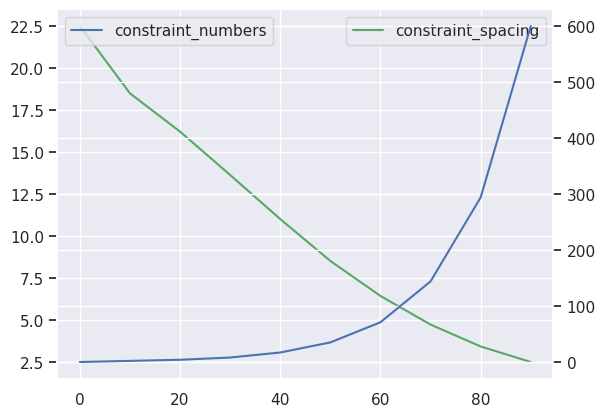

In [28]:
ax = sampled_params_df[::num].constraint_spacing.plot(c="g")
ax2 = ax.twinx()
ax2 = sampled_params_df[::num].constraint_numbers.plot(ax=ax2)
ax.legend()
ax2.legend()

sampled_params_df[
    ["constraint_numbers", "constraints_per_10000sq_km", "constraint_spacing"]
]

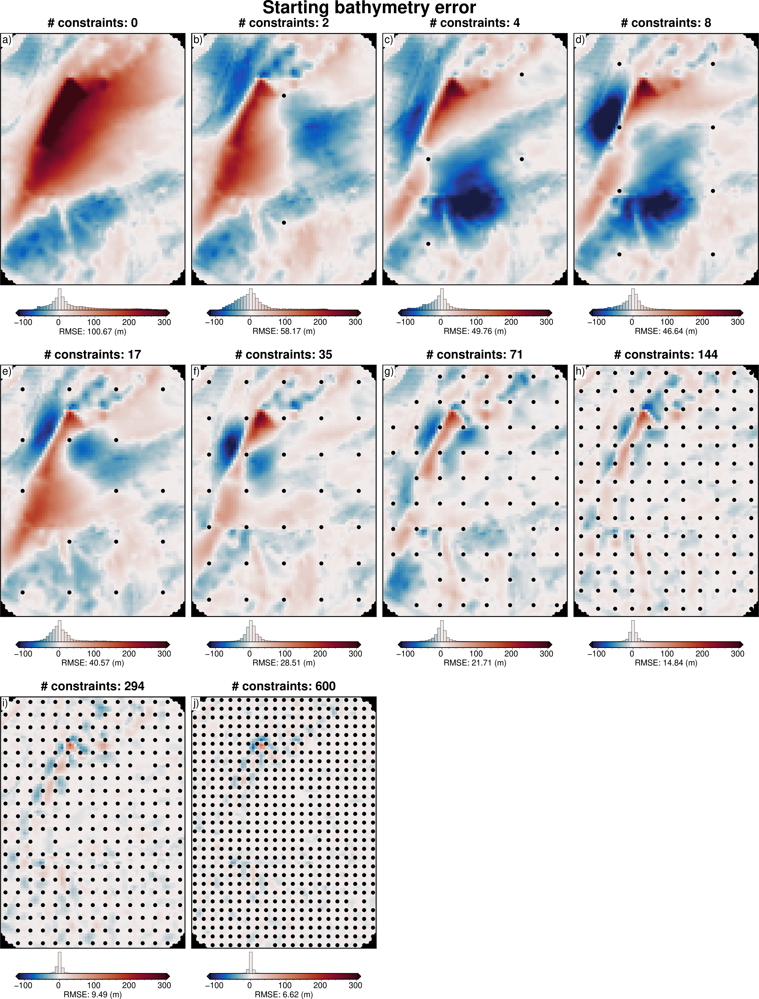

In [29]:
# subplots showing starting bathymetry error
grids = []
titles = []
cbar_labels = []
constraints = []
for i, row in sampled_params_df.iterrows():
    if i % num == 0:
        starting_bathymetry = xr.open_dataarray(row.starting_bathymetry_fname)
        constraint_points = pd.read_csv(row.constraint_points_fname)

        dif = bathymetry - starting_bathymetry

        reg = vd.pad_region(inversion_region, -spacing * 3)
        # reg = inversion_region

        dif = dif.sel(
            easting=slice(reg[0], reg[1]),
            northing=slice(reg[2], reg[3]),
        )
        # add to lists
        grids.append(dif)
        titles.append(f"# constraints: {round(row.constraint_numbers)}")
        cbar_labels.append(f"RMSE: {round(utils.rmse(dif),2)} (m)")
        constraints.append(constraint_points)

fig = maps.subplots(
    grids,
    fig_title="Starting bathymetry error",
    titles=titles,
    cbar_labels=cbar_labels,
    cmap="balance+h0",
    hist=True,
    cpt_lims=polar_utils.get_combined_min_max(grids, robust=True),
    point_sets=constraints,
    # points_style="p.02c",
    cbar_font="18p,Helvetica,black",
)

fig.show()

In [30]:
sampled_params_df["starting_bathymetry_mae"] = pd.Series()
sampled_params_df["starting_bathymetry_rmse"] = pd.Series()

for i, row in tqdm(sampled_params_df.iterrows(), total=len(sampled_params_df)):
    starting_bathymetry = xr.load_dataarray(row.starting_bathymetry_fname)

    reg = vd.pad_region(inversion_region, -spacing * 3)
    # reg = inversion_region

    starting_bathymetry = starting_bathymetry.sel(
        easting=slice(reg[0], reg[1]),
        northing=slice(reg[2], reg[3]),
    )
    inside_bathymetry = bathymetry.sel(
        easting=slice(reg[0], reg[1]),
        northing=slice(reg[2], reg[3]),
    )

    starting_bathymetry_mae = float(
        np.mean(np.abs(inside_bathymetry - starting_bathymetry))
    )
    starting_bathymetry_rmse = utils.rmse(inside_bathymetry - starting_bathymetry)

    sampled_params_df.loc[i, "starting_bathymetry_mae"] = starting_bathymetry_mae
    sampled_params_df.loc[i, "starting_bathymetry_rmse"] = starting_bathymetry_rmse
sampled_params_df

  0%|          | 0/100 [00:00<?, ?it/s]

,constraint_numbers,regional_strengths,constraint_points_fname,constraint_spacing,constraints_per_10000sq_km,constraints_starting_rmse,starting_bathymetry_fname,starting_prisms_fname,starting_bathymetry_mae,starting_bathymetry_rmse
0,0,0.00,../../results/Ross_Sea_07_constraint_spacing_v...,22.522,281.333333,0.000000,../../results/Ross_Sea_07_constraint_spacing_v...,../../results/Ross_Sea_07_constraint_spacing_v...,61.499791,100.670466
1,0,16.67,../../results/Ross_Sea_07_constraint_spacing_v...,22.522,281.333333,0.000000,../../results/Ross_Sea_07_constraint_spacing_v...,../../results/Ross_Sea_07_constraint_spacing_v...,61.499791,100.670466
2,0,33.33,../../results/Ross_Sea_07_constraint_spacing_v...,22.522,281.333333,0.000000,../../results/Ross_Sea_07_constraint_spacing_v...,../../results/Ross_Sea_07_constraint_spacing_v...,61.499791,100.670466
3,0,50.00,../../results/Ross_Sea_07_constraint_spacing_v...,22.522,281.333333,0.000000,../../results/Ross_Sea_07_constraint_spacing_v...,../../results/Ross_Sea_07_constraint_spacing_v...,61.499791,100.670466
4,0,66.67,../../results/Ross_Sea_07_constraint_spacing_v...,22.522,281.333333,0.000000,../../results/Ross_Sea_07_constraint_spacing_v...,../../results/Ross_Sea_07_constraint_spacing_v...,61.499791,100.670466
...,...,...,...,...,...,...,...,...,...,...
95,600,83.33,../../results/Ross_Sea_07_constraint_spacing_v...,2.489,480.000000,0.269469,../../results/Ross_Sea_07_constraint_spacing_v...,../../results/Ross_Sea_07_constraint_spacing_v...,3.930911,6.619145
96,600,100.00,../../results/Ross_Sea_07_constraint_spacing_v...,2.489,480.000000,0.269469,../../results/Ross_Sea_07_constraint_spacing_v...,../../results/Ross_Sea_07_constraint_spacing_v...,3.930911,6.619145
97,600,116.67,../../results/Ross_Sea_07_constraint_spacing_v...,2.489,480.000000,0.269469,../../results/Ross_Sea_07_constraint_spacing_v...,../../results/Ross_Sea_07_constraint_spacing_v...,3.930911,6.619145
98,600,133.33,../../results/Ross_Sea_07_constraint_spacing_v...,2.489,480.000000,0.269469,../../results/Ross_Sea_07_constraint_spacing_v...,../../results/Ross_Sea_07_constraint_spacing_v...,3.930911,6.619145


In [31]:
sampled_params_df.to_csv(ensemble_fname, index=False)

In [32]:
sampled_params_df = pd.read_csv(ensemble_fname)
sampled_params_df.head()

,constraint_numbers,regional_strengths,constraint_points_fname,constraint_spacing,constraints_per_10000sq_km,constraints_starting_rmse,starting_bathymetry_fname,starting_prisms_fname,starting_bathymetry_mae,starting_bathymetry_rmse
0,0,0.00,../../results/Ross_Sea_07_constraint_spacing_v...,22.522,281.333333,0.0,../../results/Ross_Sea_07_constraint_spacing_v...,../../results/Ross_Sea_07_constraint_spacing_v...,61.499791,100.670466
1,0,16.67,../../results/Ross_Sea_07_constraint_spacing_v...,22.522,281.333333,0.0,../../results/Ross_Sea_07_constraint_spacing_v...,../../results/Ross_Sea_07_constraint_spacing_v...,61.499791,100.670466
2,0,33.33,../../results/Ross_Sea_07_constraint_spacing_v...,22.522,281.333333,0.0,../../results/Ross_Sea_07_constraint_spacing_v...,../../results/Ross_Sea_07_constraint_spacing_v...,61.499791,100.670466
3,0,50.00,../../results/Ross_Sea_07_constraint_spacing_v...,22.522,281.333333,0.0,../../results/Ross_Sea_07_constraint_spacing_v...,../../results/Ross_Sea_07_constraint_spacing_v...,61.499791,100.670466
4,0,66.67,../../results/Ross_Sea_07_constraint_spacing_v...,22.522,281.333333,0.0,../../results/Ross_Sea_07_constraint_spacing_v...,../../results/Ross_Sea_07_constraint_spacing_v...,61.499791,100.670466


# Create observed gravity
* rescale regional field


In [34]:
logging.getLogger().setLevel(logging.WARNING)

sampled_params_df["grav_df_fname"] = pd.Series()

grav_grid = original_grav_df.set_index(["northing", "easting"]).to_xarray()

for i, row in tqdm(sampled_params_df.iterrows(), total=len(sampled_params_df)):
    # set file names
    grav_df_fname = f"{ensemble_path}_grav_df_{i}.csv"

    # re-scale the regional gravity
    regional_grav = utils.normalize_xarray(
        grav_grid.basement_grav_normalized,
        low=0,
        high=row.regional_strengths,
    ).rename("basement_grav")
    regional_grav -= regional_grav.mean()

    # add to new dataframe
    grav_df = copy.deepcopy(original_grav_df.drop(columns=["basement_grav_normalized"]))
    grav_df["basement_grav_scaled"] = (
        vd.grid_to_table(regional_grav).reset_index().basement_grav
    )

    # add basement and bathymetry forward gravities together to make observed gravity
    grav_df["gravity_anomaly"] = grav_df.bathymetry_grav + grav_df.basement_grav_scaled

    sampled_params_df.loc[i, "regional_stdev"] = grav_df.basement_grav_scaled.std()

    # save to files
    grav_df.to_csv(grav_df_fname, index=False)

    # add to dataframe
    sampled_params_df.loc[i, "grav_df_fname"] = grav_df_fname

sampled_params_df.head()

  0%|          | 0/100 [00:00<?, ?it/s]

,constraint_numbers,regional_strengths,constraint_points_fname,constraint_spacing,constraints_per_10000sq_km,constraints_starting_rmse,starting_bathymetry_fname,starting_prisms_fname,starting_bathymetry_mae,starting_bathymetry_rmse,grav_df_fname,regional_stdev
0,0,0.00,../../results/Ross_Sea_07_constraint_spacing_v...,22.522,281.333333,0.0,../../results/Ross_Sea_07_constraint_spacing_v...,../../results/Ross_Sea_07_constraint_spacing_v...,61.499791,100.670466,../../results/Ross_Sea_07_constraint_spacing_v...,0.000000
1,0,16.67,../../results/Ross_Sea_07_constraint_spacing_v...,22.522,281.333333,0.0,../../results/Ross_Sea_07_constraint_spacing_v...,../../results/Ross_Sea_07_constraint_spacing_v...,61.499791,100.670466,../../results/Ross_Sea_07_constraint_spacing_v...,3.410336
2,0,33.33,../../results/Ross_Sea_07_constraint_spacing_v...,22.522,281.333333,0.0,../../results/Ross_Sea_07_constraint_spacing_v...,../../results/Ross_Sea_07_constraint_spacing_v...,61.499791,100.670466,../../results/Ross_Sea_07_constraint_spacing_v...,6.818627
3,0,50.00,../../results/Ross_Sea_07_constraint_spacing_v...,22.522,281.333333,0.0,../../results/Ross_Sea_07_constraint_spacing_v...,../../results/Ross_Sea_07_constraint_spacing_v...,61.499791,100.670466,../../results/Ross_Sea_07_constraint_spacing_v...,10.228964
4,0,66.67,../../results/Ross_Sea_07_constraint_spacing_v...,22.522,281.333333,0.0,../../results/Ross_Sea_07_constraint_spacing_v...,../../results/Ross_Sea_07_constraint_spacing_v...,61.499791,100.670466,../../results/Ross_Sea_07_constraint_spacing_v...,13.639300


In [35]:
sampled_params_df.to_csv(ensemble_fname, index=False)

In [36]:
sampled_params_df = pd.read_csv(ensemble_fname)
sampled_params_df.head()

,constraint_numbers,regional_strengths,constraint_points_fname,constraint_spacing,constraints_per_10000sq_km,constraints_starting_rmse,starting_bathymetry_fname,starting_prisms_fname,starting_bathymetry_mae,starting_bathymetry_rmse,grav_df_fname,regional_stdev
0,0,0.00,../../results/Ross_Sea_07_constraint_spacing_v...,22.522,281.333333,0.0,../../results/Ross_Sea_07_constraint_spacing_v...,../../results/Ross_Sea_07_constraint_spacing_v...,61.499791,100.670466,../../results/Ross_Sea_07_constraint_spacing_v...,0.000000
1,0,16.67,../../results/Ross_Sea_07_constraint_spacing_v...,22.522,281.333333,0.0,../../results/Ross_Sea_07_constraint_spacing_v...,../../results/Ross_Sea_07_constraint_spacing_v...,61.499791,100.670466,../../results/Ross_Sea_07_constraint_spacing_v...,3.410336
2,0,33.33,../../results/Ross_Sea_07_constraint_spacing_v...,22.522,281.333333,0.0,../../results/Ross_Sea_07_constraint_spacing_v...,../../results/Ross_Sea_07_constraint_spacing_v...,61.499791,100.670466,../../results/Ross_Sea_07_constraint_spacing_v...,6.818627
3,0,50.00,../../results/Ross_Sea_07_constraint_spacing_v...,22.522,281.333333,0.0,../../results/Ross_Sea_07_constraint_spacing_v...,../../results/Ross_Sea_07_constraint_spacing_v...,61.499791,100.670466,../../results/Ross_Sea_07_constraint_spacing_v...,10.228964
4,0,66.67,../../results/Ross_Sea_07_constraint_spacing_v...,22.522,281.333333,0.0,../../results/Ross_Sea_07_constraint_spacing_v...,../../results/Ross_Sea_07_constraint_spacing_v...,61.499791,100.670466,../../results/Ross_Sea_07_constraint_spacing_v...,13.639300


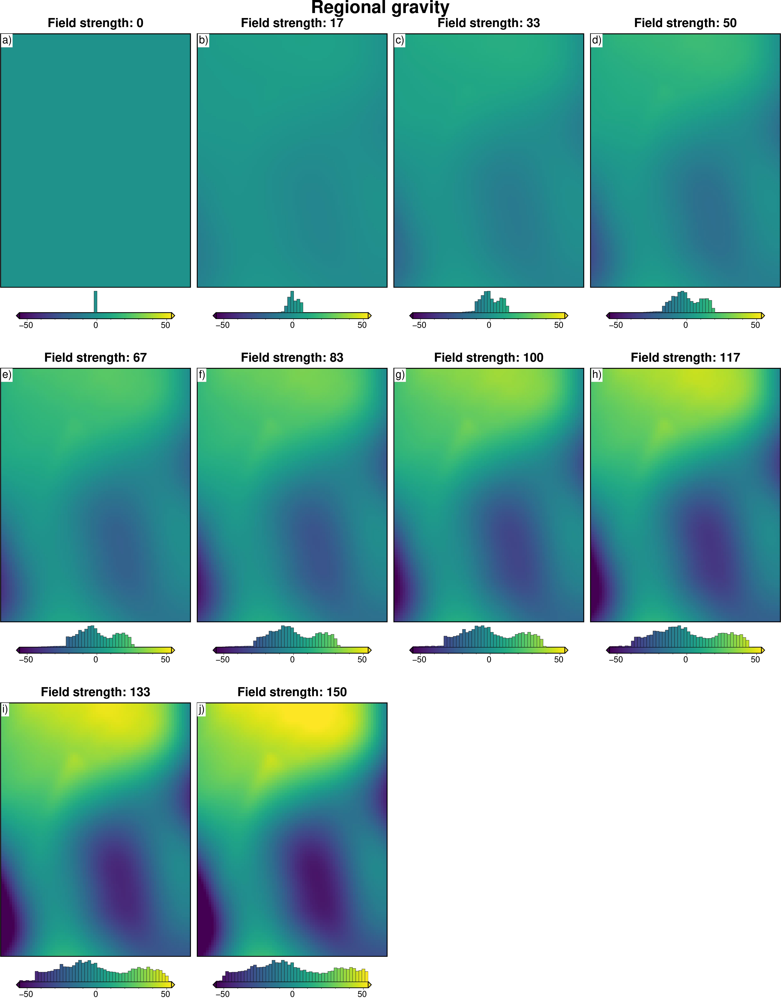

In [37]:
# subplots showing true regional gravity
grids = []
titles = []
for i, row in (
    sampled_params_df.sort_values(by=["regional_strengths"]).reset_index().iterrows()
):
    if i % num == 0:
        grav_df = pd.read_csv(row.grav_df_fname)

        grid = (
            grav_df.set_index(["northing", "easting"]).to_xarray().basement_grav_scaled
        )

        # add to lists
        grids.append(grid)
        titles.append(f"Field strength: {round(row.regional_strengths)}")

fig = maps.subplots(
    grids,
    fig_title="Regional gravity",
    titles=titles,
    hist=True,
    cpt_lims=polar_utils.get_combined_min_max(grids, robust=True),
    cbar_font="18p,Helvetica,black",
)

fig.show()

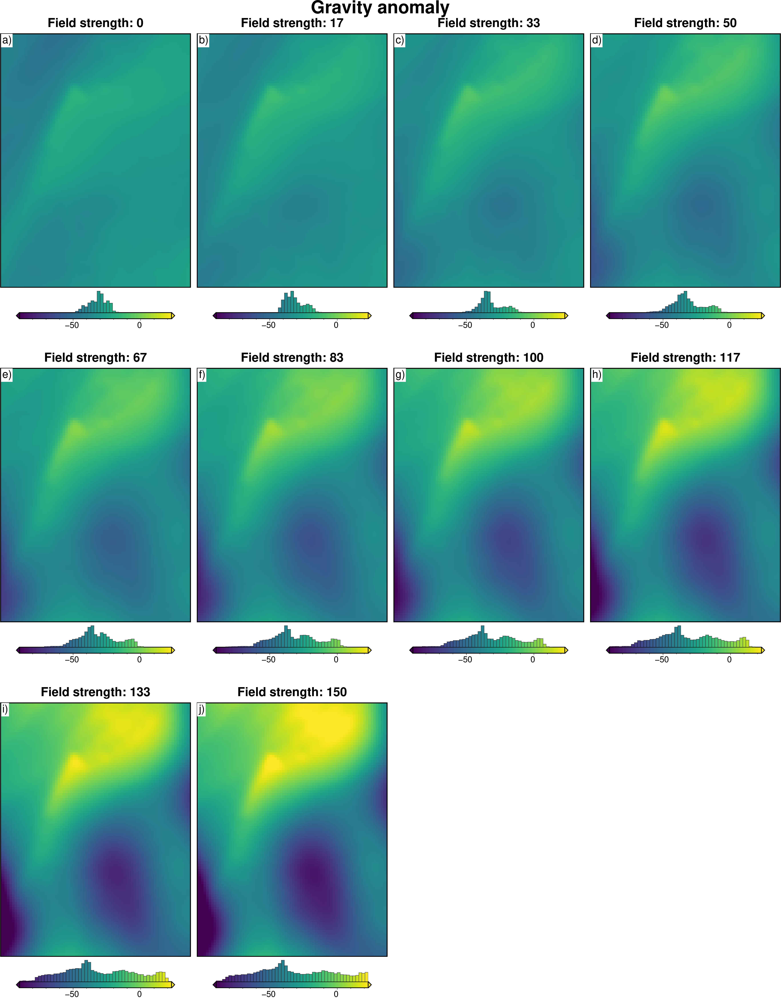

In [38]:
# subplots showing gravity anomaly
grids = []
titles = []
for i, row in (
    sampled_params_df.sort_values(by=["regional_strengths"]).reset_index().iterrows()
):
    if i % num == 0:
        grav_df = pd.read_csv(row.grav_df_fname)

        grid = grav_df.set_index(["northing", "easting"]).to_xarray().gravity_anomaly

        # add to lists
        grids.append(grid)
        titles.append(f"Field strength: {round(row.regional_strengths)}")

fig = maps.subplots(
    grids,
    fig_title="Gravity anomaly",
    titles=titles,
    hist=True,
    cpt_lims=polar_utils.get_combined_min_max(grids, robust=True),
    cbar_font="18p,Helvetica,black",
)

fig.show()

# Calculate starting gravity and regional

In [39]:
def regional_comparison(df):
    # grid the results
    grav_grid = df.set_index(["northing", "easting"]).to_xarray()

    # compare with true regional
    _ = polar_utils.grd_compare(
        grav_grid.basement_grav,
        grav_grid.reg,
        plot=True,
        grid1_name="True regional misfit",
        grid2_name="Regional misfit",
        hist=True,
        cbar_yoffset=1,
        inset=False,
        verbose="q",
        title="difference",
        grounding_line=False,
        points=constraint_points.rename(columns={"easting": "x", "northing": "y"}),
        points_style="x.3c",
    )
    # compare with true residual
    # _ = polar_utils.grd_compare(
    #     grav_grid.true_res,
    #     grav_grid.res,
    #     plot=True,
    #     grid1_name="True residual misfit",
    #     grid2_name="Residual misfit",
    #     cmap="balance+h0",
    #     hist=True,
    #     cbar_yoffset=1,
    #     inset=False,
    #     verbose="q",
    #     title="difference",
    #     grounding_line=False,
    #     points=constraint_points.rename(columns={"easting": "x", "northing": "y"}),
    #     points_style="x.3c",
    # )

In [40]:
logging.getLogger().setLevel(logging.WARNING)

# sampled_params_df["reg_eqs_damping"] = pd.Series()
# sampled_params_df["reg_eqs_depth"] = pd.Series()
# sampled_params_df["reg_eqs_score"] = pd.Series()

# estimate regional
# regional_grav_kwargs = dict(
#     method="constraints",
#     grid_method="eq_sources",
#     cv=True,
#     cv_kwargs=dict(
#         n_trials=50,
#         # damping_limits=(1e-30, 10),
#         depth_limits=(10, 500e3),
#         progressbar=False,
#         fname="../../tmp_outputs/07_regional_sep",
#     ),
#     damping=None,
#     block_size=None,
# )
regional_grav_kwargs = dict(
    method="constraints",
    grid_method="pygmt",
    tension_factor=0.25,
)

for _i, row in tqdm(sampled_params_df.iterrows(), total=len(sampled_params_df)):
    # load data
    starting_prisms = xr.load_dataset(row.starting_prisms_fname)
    grav_df = pd.read_csv(row.grav_df_fname)
    constraint_points = pd.read_csv(row.constraint_points_fname)

    # calculate the starting gravity
    grav_df["starting_gravity"] = starting_prisms.prism_layer.gravity(
        coordinates=(
            grav_df.easting,
            grav_df.northing,
            grav_df.upward,
        ),
        field="g_z",
        progressbar=False,
    )

    # calculate the true residual misfit
    grav_df["true_res"] = grav_df.bathymetry_grav - grav_df.starting_gravity

    # temporarily set some kwargs
    temp_reg_kwargs = copy.deepcopy(regional_grav_kwargs)
    temp_reg_kwargs["constraints_df"] = constraint_points
    # temp_reg_kwargs["cv_kwargs"]["fname"] = f"../../tmp_outputs/07_regional_sep_{i}"
    # temp_reg_kwargs["cv_kwargs"]["plot"] = False
    # temp_reg_kwargs["cv_kwargs"]["progressbar"] = False

    grav_df = regional.regional_separation(
        grav_df=grav_df,
        **temp_reg_kwargs,
    )
    # regional_comparison(grav_df)

    # # re-load the study from the saved pickle file
    # with pathlib.Path(f"../../tmp_outputs/07_regional_sep_{i}.pickle").open("rb") as f:
    #     reg_study = pickle.load(f)
    # # reg_eq_damping = min(reg_study.best_trials, key=lambda t: t.values[0]).params[
    # #     "damping"
    # # ]
    # reg_eq_depth = min(reg_study.best_trials, key=lambda t: t.values[0]).params["depth"]
    # reg_score = reg_study.best_trial.value

    # # add to dataframe
    # # sampled_params_df.loc[i, "reg_eqs_damping"] = reg_eq_damping
    # sampled_params_df.loc[i, "reg_eqs_depth"] = reg_eq_depth
    # sampled_params_df.loc[i, "reg_eqs_score"] = reg_score

    # resave gravity dataframe
    grav_df.to_csv(row.grav_df_fname, index=False)

sampled_params_df.head()

  0%|          | 0/100 [00:00<?, ?it/s]

,constraint_numbers,regional_strengths,constraint_points_fname,constraint_spacing,constraints_per_10000sq_km,constraints_starting_rmse,starting_bathymetry_fname,starting_prisms_fname,starting_bathymetry_mae,starting_bathymetry_rmse,grav_df_fname,regional_stdev
0,0,0.00,../../results/Ross_Sea_07_constraint_spacing_v...,22.522,281.333333,0.0,../../results/Ross_Sea_07_constraint_spacing_v...,../../results/Ross_Sea_07_constraint_spacing_v...,61.499791,100.670466,../../results/Ross_Sea_07_constraint_spacing_v...,0.000000
1,0,16.67,../../results/Ross_Sea_07_constraint_spacing_v...,22.522,281.333333,0.0,../../results/Ross_Sea_07_constraint_spacing_v...,../../results/Ross_Sea_07_constraint_spacing_v...,61.499791,100.670466,../../results/Ross_Sea_07_constraint_spacing_v...,3.410336
2,0,33.33,../../results/Ross_Sea_07_constraint_spacing_v...,22.522,281.333333,0.0,../../results/Ross_Sea_07_constraint_spacing_v...,../../results/Ross_Sea_07_constraint_spacing_v...,61.499791,100.670466,../../results/Ross_Sea_07_constraint_spacing_v...,6.818627
3,0,50.00,../../results/Ross_Sea_07_constraint_spacing_v...,22.522,281.333333,0.0,../../results/Ross_Sea_07_constraint_spacing_v...,../../results/Ross_Sea_07_constraint_spacing_v...,61.499791,100.670466,../../results/Ross_Sea_07_constraint_spacing_v...,10.228964
4,0,66.67,../../results/Ross_Sea_07_constraint_spacing_v...,22.522,281.333333,0.0,../../results/Ross_Sea_07_constraint_spacing_v...,../../results/Ross_Sea_07_constraint_spacing_v...,61.499791,100.670466,../../results/Ross_Sea_07_constraint_spacing_v...,13.639300


In [41]:
sampled_params_df.to_csv(ensemble_fname, index=False)

In [42]:
sampled_params_df = pd.read_csv(ensemble_fname)
sampled_params_df.head()

,constraint_numbers,regional_strengths,constraint_points_fname,constraint_spacing,constraints_per_10000sq_km,constraints_starting_rmse,starting_bathymetry_fname,starting_prisms_fname,starting_bathymetry_mae,starting_bathymetry_rmse,grav_df_fname,regional_stdev
0,0,0.00,../../results/Ross_Sea_07_constraint_spacing_v...,22.522,281.333333,0.0,../../results/Ross_Sea_07_constraint_spacing_v...,../../results/Ross_Sea_07_constraint_spacing_v...,61.499791,100.670466,../../results/Ross_Sea_07_constraint_spacing_v...,0.000000
1,0,16.67,../../results/Ross_Sea_07_constraint_spacing_v...,22.522,281.333333,0.0,../../results/Ross_Sea_07_constraint_spacing_v...,../../results/Ross_Sea_07_constraint_spacing_v...,61.499791,100.670466,../../results/Ross_Sea_07_constraint_spacing_v...,3.410336
2,0,33.33,../../results/Ross_Sea_07_constraint_spacing_v...,22.522,281.333333,0.0,../../results/Ross_Sea_07_constraint_spacing_v...,../../results/Ross_Sea_07_constraint_spacing_v...,61.499791,100.670466,../../results/Ross_Sea_07_constraint_spacing_v...,6.818627
3,0,50.00,../../results/Ross_Sea_07_constraint_spacing_v...,22.522,281.333333,0.0,../../results/Ross_Sea_07_constraint_spacing_v...,../../results/Ross_Sea_07_constraint_spacing_v...,61.499791,100.670466,../../results/Ross_Sea_07_constraint_spacing_v...,10.228964
4,0,66.67,../../results/Ross_Sea_07_constraint_spacing_v...,22.522,281.333333,0.0,../../results/Ross_Sea_07_constraint_spacing_v...,../../results/Ross_Sea_07_constraint_spacing_v...,61.499791,100.670466,../../results/Ross_Sea_07_constraint_spacing_v...,13.639300


In [43]:
# subplots showing grav data loss from sampling and noise
grids = []
cbar_labels = []
row_titles = []
column_titles = []
points = []
# iterate over the ensemble starting with high noise, low line numbers
# row per regional strength and column per constraint numbers
for i, row in sampled_params_df.sort_values(
    by=["regional_strengths", "constraint_numbers"],
    ascending=False,
).iterrows():
    constraint_points = pd.read_csv(row.constraint_points_fname)

    grav_df = pd.read_csv(row.grav_df_fname)
    grav_grid = grav_df.set_index(["northing", "easting"]).to_xarray()
    dif = grav_grid.basement_grav_scaled - grav_grid.reg
    # add to lists
    grids.append(dif)
    cbar_labels.append(f"RMSE: {round(utils.rmse(dif),2)} (mGal)")
    if i % num == 0:
        column_titles.append(f"{row.constraint_numbers} constraints")
    if i < num:
        row_titles.append(f"strength: {round(row.regional_strengths,1)} mGal")
    points.append(constraint_points)
print(row_titles)
print(column_titles)

fig = maps.subplots(
    grids,
    fig_height=8,
    fig_title="Regional gravity error",
    fig_title_font="75p,Helvetica-Bold,black",
    fig_title_y_offset="5c",
    cbar_labels=cbar_labels,
    cmap="balance+h0",
    # hist=True,
    cpt_lims=polar_utils.get_combined_min_max(grids, robust=True),
    cbar_font="18p,Helvetica,black",
    row_titles=row_titles,
    column_titles=column_titles,
    row_titles_font="25p,Helvetica,black",
    column_titles_font="25p,Helvetica,black",
    point_sets=points,
)
fig.show()

['strength: 150.0 mGal', 'strength: 133.3 mGal', 'strength: 116.7 mGal', 'strength: 100.0 mGal', 'strength: 83.3 mGal', 'strength: 66.7 mGal', 'strength: 50.0 mGal', 'strength: 33.3 mGal', 'strength: 16.7 mGal', 'strength: 0.0 mGal']
['600 constraints', '294 constraints', '144 constraints', '71 constraints', '35 constraints', '17 constraints', '8 constraints', '4 constraints', '2 constraints', '0 constraints']


In [45]:
# subplots showing grav data loss from sampling and noise
grids = []
cbar_labels = []
row_titles = []
column_titles = []
points = []
# iterate over the ensemble starting with high noise, low line numbers
# row per regional strength and column per constraint numbers
for i, row in sampled_params_df.sort_values(
    by=["regional_strengths", "constraint_numbers"],
    ascending=False,
).iterrows():
    constraint_points = pd.read_csv(row.constraint_points_fname)

    grav_df = pd.read_csv(row.grav_df_fname)
    grav_grid = grav_df.set_index(["northing", "easting"]).to_xarray()
    # add to lists
    dif = grav_grid.basement_grav_scaled - grav_grid.reg

    grids.append(grav_grid.reg)
    cbar_labels.append(f"RMSE: {round(utils.rmse(dif),2)} (mGal)")
    if i % num == 0:
        column_titles.append(f"{row.constraint_numbers} constraints")
    if i < num:
        row_titles.append(f"strength: {round(row.regional_strengths,1)} mGal")
    points.append(constraint_points)
print(row_titles)
print(column_titles)

fig = maps.subplots(
    grids,
    fig_height=8,
    fig_title="Regional gravity error",
    fig_title_font="75p,Helvetica-Bold,black",
    fig_title_y_offset="5c",
    cbar_labels=cbar_labels,
    cmap="balance+h0",
    # hist=True,
    cpt_lims=polar_utils.get_combined_min_max(grids, robust=True),
    cbar_font="18p,Helvetica,black",
    row_titles=row_titles,
    column_titles=column_titles,
    row_titles_font="25p,Helvetica,black",
    column_titles_font="25p,Helvetica,black",
    point_sets=points,
)
fig.show()

['strength: 150.0 mGal', 'strength: 133.3 mGal', 'strength: 116.7 mGal', 'strength: 100.0 mGal', 'strength: 83.3 mGal', 'strength: 66.7 mGal', 'strength: 50.0 mGal', 'strength: 33.3 mGal', 'strength: 16.7 mGal', 'strength: 0.0 mGal']
['600 constraints', '294 constraints', '144 constraints', '71 constraints', '35 constraints', '17 constraints', '8 constraints', '4 constraints', '2 constraints', '0 constraints']


In [9]:
sampled_params_df["regional_error"] = np.nan
sampled_params_df["gravity_anomaly_rms"] = np.nan

for i, row in sampled_params_df.iterrows():
    grav_df = pd.read_csv(row.grav_df_fname)

    sampled_params_df.loc[i, "regional_error"] = utils.rmse(
        grav_df.basement_grav_scaled - grav_df.reg
    )
    sampled_params_df.loc[i, "gravity_anomaly_rms"] = utils.rmse(
        grav_df.gravity_anomaly
    )
sampled_params_df

,constraint_numbers,regional_strengths,constraint_points_fname,constraint_spacing,constraints_per_10000sq_km,constraints_starting_rmse,starting_bathymetry_fname,starting_prisms_fname,starting_bathymetry_mae,starting_bathymetry_rmse,grav_df_fname,regional_stdev,regional_error,gravity_anomaly_rms
0,0,0.00,../../results/Ross_Sea_07_constraint_spacing_v...,22.522,281.333333,0.000000,../../results/Ross_Sea_07_constraint_spacing_v...,../../results/Ross_Sea_07_constraint_spacing_v...,61.499791,100.670466,../../results/Ross_Sea_07_constraint_spacing_v...,0.000000,0.119732,32.377824
1,0,16.67,../../results/Ross_Sea_07_constraint_spacing_v...,22.522,281.333333,0.000000,../../results/Ross_Sea_07_constraint_spacing_v...,../../results/Ross_Sea_07_constraint_spacing_v...,61.499791,100.670466,../../results/Ross_Sea_07_constraint_spacing_v...,3.410336,1.500404,32.470335
2,0,33.33,../../results/Ross_Sea_07_constraint_spacing_v...,22.522,281.333333,0.000000,../../results/Ross_Sea_07_constraint_spacing_v...,../../results/Ross_Sea_07_constraint_spacing_v...,61.499791,100.670466,../../results/Ross_Sea_07_constraint_spacing_v...,6.818627,3.024948,32.917397
3,0,50.00,../../results/Ross_Sea_07_constraint_spacing_v...,22.522,281.333333,0.000000,../../results/Ross_Sea_07_constraint_spacing_v...,../../results/Ross_Sea_07_constraint_spacing_v...,61.499791,100.670466,../../results/Ross_Sea_07_constraint_spacing_v...,10.228964,4.551860,33.705425
4,0,66.67,../../results/Ross_Sea_07_constraint_spacing_v...,22.522,281.333333,0.000000,../../results/Ross_Sea_07_constraint_spacing_v...,../../results/Ross_Sea_07_constraint_spacing_v...,61.499791,100.670466,../../results/Ross_Sea_07_constraint_spacing_v...,13.639300,6.079123,34.811121
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,600,83.33,../../results/Ross_Sea_07_constraint_spacing_v...,2.489,480.000000,0.269469,../../results/Ross_Sea_07_constraint_spacing_v...,../../results/Ross_Sea_07_constraint_spacing_v...,3.930911,6.619145,../../results/Ross_Sea_07_constraint_spacing_v...,17.047591,0.095145,36.204475
96,600,100.00,../../results/Ross_Sea_07_constraint_spacing_v...,2.489,480.000000,0.269469,../../results/Ross_Sea_07_constraint_spacing_v...,../../results/Ross_Sea_07_constraint_spacing_v...,3.930911,6.619145,../../results/Ross_Sea_07_constraint_spacing_v...,20.457927,0.105198,37.855304
97,600,116.67,../../results/Ross_Sea_07_constraint_spacing_v...,2.489,480.000000,0.269469,../../results/Ross_Sea_07_constraint_spacing_v...,../../results/Ross_Sea_07_constraint_spacing_v...,3.930911,6.619145,../../results/Ross_Sea_07_constraint_spacing_v...,23.868264,0.116277,39.730868
98,600,133.33,../../results/Ross_Sea_07_constraint_spacing_v...,2.489,480.000000,0.269469,../../results/Ross_Sea_07_constraint_spacing_v...,../../results/Ross_Sea_07_constraint_spacing_v...,3.930911,6.619145,../../results/Ross_Sea_07_constraint_spacing_v...,27.276554,0.128108,41.799631


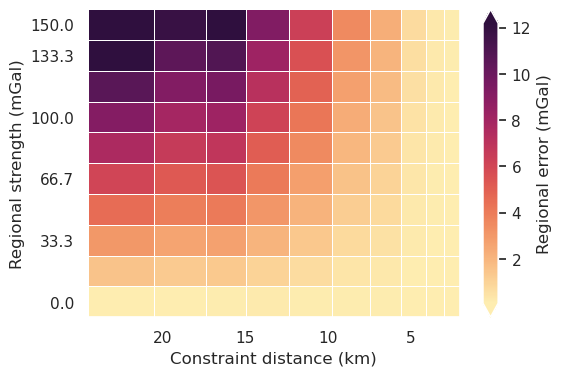

In [10]:
fig = RIS_plotting.plot_2var_ensemble(
    sampled_params_df,
    figsize=(6, 4),
    x="constraint_spacing",
    x_title="Constraint distance (km)",
    # x="constraint_numbers",
    # x_title="Number of constraints",
    # x="constraints_per_10000sq_km",
    # x_title="Constraints per $10000 km^2$",
    y="regional_strengths",
    y_title="Regional strength (mGal)",
    background="regional_error",
    background_title="Regional error (mGal)",
    # plot_title="Constraint spacing vs regional strength",
    background_robust=True,
    # logx=True,
    flipx=True,
)

<!-- # Add noise to gravity data -->

# Damping Cross Validation

In [11]:
logging.getLogger().setLevel(logging.WARNING)

for i, row in tqdm(sampled_params_df.iterrows(), total=len(sampled_params_df)):
    # set results file name
    damping_cv_results_fname = f"{ensemble_path}_damping_cv_{i}"

    # add results file name
    sampled_params_df.loc[i, "damping_cv_results_fname"] = damping_cv_results_fname

    # load data
    starting_prisms = xr.load_dataset(row.starting_prisms_fname)
    grav_df = pd.read_csv(row.grav_df_fname)

    # set kwargs to pass to the inversion
    kwargs = {
        # set stopping criteria
        "max_iterations": 200,
        "l2_norm_tolerance": 0.2**0.5,  # square root of the gravity noise
        "delta_l2_norm_tolerance": 1.008,
    }

    # run the inversion workflow, including a cross validation for the damping parameter
    _ = inversion.run_inversion_workflow(
        grav_df=grav_df,
        starting_prisms=starting_prisms,
        # for creating test/train splits
        grav_spacing=spacing,
        inversion_region=inversion_region,
        run_damping_cv=True,
        # damping_limits=(0.001, 0.1),
        # damping_cv_trials=8,
        damping_limits=(0.025, 0.025),
        damping_cv_trials=1,
        damping_cv_startup_trials=1,
        damping_cv_progressbar=False,
        # plot_cv=True,
        fname=damping_cv_results_fname,
        **kwargs,
    )

    sampled_params_df.head()

  0%|          | 0/100 [00:00<?, ?it/s]

In [12]:
sampled_params_df.to_csv(ensemble_fname, index=False)

In [13]:
sampled_params_df = pd.read_csv(ensemble_fname)
sampled_params_df.head()

,constraint_numbers,regional_strengths,constraint_points_fname,constraint_spacing,constraints_per_10000sq_km,constraints_starting_rmse,starting_bathymetry_fname,starting_prisms_fname,starting_bathymetry_mae,starting_bathymetry_rmse,grav_df_fname,regional_stdev,regional_error,gravity_anomaly_rms,damping_cv_results_fname
0,0,0.00,../../results/Ross_Sea_07_constraint_spacing_v...,22.522,281.333333,0.0,../../results/Ross_Sea_07_constraint_spacing_v...,../../results/Ross_Sea_07_constraint_spacing_v...,61.499791,100.670466,../../results/Ross_Sea_07_constraint_spacing_v...,0.000000,0.119732,32.377824,../../results/Ross_Sea_07_constraint_spacing_v...
1,0,16.67,../../results/Ross_Sea_07_constraint_spacing_v...,22.522,281.333333,0.0,../../results/Ross_Sea_07_constraint_spacing_v...,../../results/Ross_Sea_07_constraint_spacing_v...,61.499791,100.670466,../../results/Ross_Sea_07_constraint_spacing_v...,3.410336,1.500404,32.470335,../../results/Ross_Sea_07_constraint_spacing_v...
2,0,33.33,../../results/Ross_Sea_07_constraint_spacing_v...,22.522,281.333333,0.0,../../results/Ross_Sea_07_constraint_spacing_v...,../../results/Ross_Sea_07_constraint_spacing_v...,61.499791,100.670466,../../results/Ross_Sea_07_constraint_spacing_v...,6.818627,3.024948,32.917397,../../results/Ross_Sea_07_constraint_spacing_v...
3,0,50.00,../../results/Ross_Sea_07_constraint_spacing_v...,22.522,281.333333,0.0,../../results/Ross_Sea_07_constraint_spacing_v...,../../results/Ross_Sea_07_constraint_spacing_v...,61.499791,100.670466,../../results/Ross_Sea_07_constraint_spacing_v...,10.228964,4.551860,33.705425,../../results/Ross_Sea_07_constraint_spacing_v...
4,0,66.67,../../results/Ross_Sea_07_constraint_spacing_v...,22.522,281.333333,0.0,../../results/Ross_Sea_07_constraint_spacing_v...,../../results/Ross_Sea_07_constraint_spacing_v...,61.499791,100.670466,../../results/Ross_Sea_07_constraint_spacing_v...,13.639300,6.079123,34.811121,../../results/Ross_Sea_07_constraint_spacing_v...


In [14]:
sampled_params_df["best_damping"] = pd.Series()
sampled_params_df["constraints_rmse"] = pd.Series()
sampled_params_df["inversion_rmse"] = pd.Series()
sampled_params_df["inversion_mae"] = pd.Series()
sampled_params_df["inverted_bathymetry_fname"] = pd.Series()

for i, row in sampled_params_df.iterrows():
    constraint_points = pd.read_csv(row.constraint_points_fname)

    # load saved inversion results
    with pathlib.Path(f"{row.damping_cv_results_fname}_results.pickle").open("rb") as f:
        results = pickle.load(f)

    # load study
    with pathlib.Path(f"{row.damping_cv_results_fname}_damping_cv_study.pickle").open(
        "rb"
    ) as f:
        study = pickle.load(f)

    # collect the results
    topo_results, grav_results, parameters, elapsed_time = results
    final_bathymetry = topo_results.set_index(["northing", "easting"]).to_xarray().topo
    # fig = maps.plot_grd(final_bathymetry)
    # fig.show()
    # add best damping to dataframe
    sampled_params_df.loc[i, "best_damping"] = parameters.get("Solver damping")

    # if row.regional_strengths == 0:
    #     plotting.plot_convergence(
    #         grav_results,
    #         params=parameters,
    #     )

    #     plotting.plot_cv_scores(
    #             study.trials_dataframe().value.values,
    #             study.trials_dataframe().params_damping.values,
    #             param_name="Damping",
    #             logx=True,
    #             logy=True,
    #         )

    #     plotting.plot_inversion_results(
    #         grav_results,
    #         topo_results,
    #         parameters,
    #         inversion_region,
    #         iters_to_plot=2,
    #         # plot_iter_results=False,
    #         plot_topo_results=False,
    #         plot_grav_results=False,
    #     )

    #     _ = polar_utils.grd_compare(
    #         bathymetry,
    #         final_bathymetry,
    #         region=inversion_region,
    #         plot=True,
    #         grid1_name="True topography",
    #         grid2_name="Inverted topography",
    #         robust=True,
    #         hist=True,
    #         inset=False,
    #         verbose="q",
    #         title="difference",
    #         grounding_line=False,
    #         reverse_cpt=True,
    #         cmap="rain",
    #         points=constraint_points.rename(columns={"easting": "x", "northing": "y"}),
    #         points_style="x.2c",
    #     )

    # sample the inverted topography at the constraint points
    constraint_points = utils.sample_grids(
        constraint_points,
        final_bathymetry,
        "inverted_damping_cv_bathymetry",
        coord_names=("easting", "northing"),
    )
    constraints_rmse = utils.rmse(
        constraint_points.true_upward - constraint_points.inverted_damping_cv_bathymetry
    )
    reg = vd.pad_region(inversion_region, -spacing * 3)
    # reg = inversion_region

    bathymetry_inner = bathymetry.sel(
        easting=slice(reg[0], reg[1]),
        northing=slice(reg[2], reg[3]),
    )
    final_bathymetry_inner = final_bathymetry.sel(
        easting=slice(reg[0], reg[1]),
        northing=slice(reg[2], reg[3]),
    )
    inversion_rmse = utils.rmse(bathymetry_inner - final_bathymetry_inner)
    inversion_mae = float(np.mean(np.abs(bathymetry_inner - final_bathymetry_inner)))

    # save final topography to file
    inverted_bathymetry_fname = f"{ensemble_path}_inverted_damping_cv_bathymetry_{i}.nc"
    final_bathymetry.to_netcdf(inverted_bathymetry_fname)

    # add to dataframe
    sampled_params_df.loc[i, "inverted_bathymetry_fname"] = inverted_bathymetry_fname
    sampled_params_df.loc[i, "constraints_rmse"] = constraints_rmse
    sampled_params_df.loc[i, "inversion_rmse"] = inversion_rmse
    sampled_params_df.loc[i, "inversion_mae"] = inversion_mae

sampled_params_df.head()

,constraint_numbers,regional_strengths,constraint_points_fname,constraint_spacing,constraints_per_10000sq_km,constraints_starting_rmse,starting_bathymetry_fname,starting_prisms_fname,starting_bathymetry_mae,starting_bathymetry_rmse,grav_df_fname,regional_stdev,regional_error,gravity_anomaly_rms,damping_cv_results_fname,best_damping,constraints_rmse,inversion_rmse,inversion_mae,inverted_bathymetry_fname
0,0,0.00,../../results/Ross_Sea_07_constraint_spacing_v...,22.522,281.333333,0.0,../../results/Ross_Sea_07_constraint_spacing_v...,../../results/Ross_Sea_07_constraint_spacing_v...,61.499791,100.670466,../../results/Ross_Sea_07_constraint_spacing_v...,0.000000,0.119732,32.377824,../../results/Ross_Sea_07_constraint_spacing_v...,0.025,2.050877,3.415512,2.362684,../../results/Ross_Sea_07_constraint_spacing_v...
1,0,16.67,../../results/Ross_Sea_07_constraint_spacing_v...,22.522,281.333333,0.0,../../results/Ross_Sea_07_constraint_spacing_v...,../../results/Ross_Sea_07_constraint_spacing_v...,61.499791,100.670466,../../results/Ross_Sea_07_constraint_spacing_v...,3.410336,1.500404,32.470335,../../results/Ross_Sea_07_constraint_spacing_v...,0.025,3.01626,28.008217,21.611857,../../results/Ross_Sea_07_constraint_spacing_v...
2,0,33.33,../../results/Ross_Sea_07_constraint_spacing_v...,22.522,281.333333,0.0,../../results/Ross_Sea_07_constraint_spacing_v...,../../results/Ross_Sea_07_constraint_spacing_v...,61.499791,100.670466,../../results/Ross_Sea_07_constraint_spacing_v...,6.818627,3.024948,32.917397,../../results/Ross_Sea_07_constraint_spacing_v...,0.025,4.117658,56.421306,43.700982,../../results/Ross_Sea_07_constraint_spacing_v...
3,0,50.00,../../results/Ross_Sea_07_constraint_spacing_v...,22.522,281.333333,0.0,../../results/Ross_Sea_07_constraint_spacing_v...,../../results/Ross_Sea_07_constraint_spacing_v...,61.499791,100.670466,../../results/Ross_Sea_07_constraint_spacing_v...,10.228964,4.551860,33.705425,../../results/Ross_Sea_07_constraint_spacing_v...,0.025,5.265726,84.940059,65.895648,../../results/Ross_Sea_07_constraint_spacing_v...
4,0,66.67,../../results/Ross_Sea_07_constraint_spacing_v...,22.522,281.333333,0.0,../../results/Ross_Sea_07_constraint_spacing_v...,../../results/Ross_Sea_07_constraint_spacing_v...,61.499791,100.670466,../../results/Ross_Sea_07_constraint_spacing_v...,13.639300,6.079123,34.811121,../../results/Ross_Sea_07_constraint_spacing_v...,0.025,6.430753,113.49699,88.113598,../../results/Ross_Sea_07_constraint_spacing_v...


In [15]:
sampled_params_df.to_csv(ensemble_fname, index=False)

In [16]:
ensemble_fname[0:-4]

'../../results/Ross_Sea_07_constraint_spacing_vs_regional_strength_ensemble_100_lims_from_all_shelves_logscale'

In [17]:
# sampled_params_df.to_csv(f"{ensemble_fname[0:-4]}_backup.csv", index=False)

In [18]:
sampled_params_df = pd.read_csv(ensemble_fname)
sampled_params_df.head()

,constraint_numbers,regional_strengths,constraint_points_fname,constraint_spacing,constraints_per_10000sq_km,constraints_starting_rmse,starting_bathymetry_fname,starting_prisms_fname,starting_bathymetry_mae,starting_bathymetry_rmse,grav_df_fname,regional_stdev,regional_error,gravity_anomaly_rms,damping_cv_results_fname,best_damping,constraints_rmse,inversion_rmse,inversion_mae,inverted_bathymetry_fname
0,0,0.00,../../results/Ross_Sea_07_constraint_spacing_v...,22.522,281.333333,0.0,../../results/Ross_Sea_07_constraint_spacing_v...,../../results/Ross_Sea_07_constraint_spacing_v...,61.499791,100.670466,../../results/Ross_Sea_07_constraint_spacing_v...,0.000000,0.119732,32.377824,../../results/Ross_Sea_07_constraint_spacing_v...,0.025,2.050877,3.415512,2.362684,../../results/Ross_Sea_07_constraint_spacing_v...
1,0,16.67,../../results/Ross_Sea_07_constraint_spacing_v...,22.522,281.333333,0.0,../../results/Ross_Sea_07_constraint_spacing_v...,../../results/Ross_Sea_07_constraint_spacing_v...,61.499791,100.670466,../../results/Ross_Sea_07_constraint_spacing_v...,3.410336,1.500404,32.470335,../../results/Ross_Sea_07_constraint_spacing_v...,0.025,3.016260,28.008217,21.611857,../../results/Ross_Sea_07_constraint_spacing_v...
2,0,33.33,../../results/Ross_Sea_07_constraint_spacing_v...,22.522,281.333333,0.0,../../results/Ross_Sea_07_constraint_spacing_v...,../../results/Ross_Sea_07_constraint_spacing_v...,61.499791,100.670466,../../results/Ross_Sea_07_constraint_spacing_v...,6.818627,3.024948,32.917397,../../results/Ross_Sea_07_constraint_spacing_v...,0.025,4.117658,56.421306,43.700982,../../results/Ross_Sea_07_constraint_spacing_v...
3,0,50.00,../../results/Ross_Sea_07_constraint_spacing_v...,22.522,281.333333,0.0,../../results/Ross_Sea_07_constraint_spacing_v...,../../results/Ross_Sea_07_constraint_spacing_v...,61.499791,100.670466,../../results/Ross_Sea_07_constraint_spacing_v...,10.228964,4.551860,33.705425,../../results/Ross_Sea_07_constraint_spacing_v...,0.025,5.265726,84.940059,65.895648,../../results/Ross_Sea_07_constraint_spacing_v...
4,0,66.67,../../results/Ross_Sea_07_constraint_spacing_v...,22.522,281.333333,0.0,../../results/Ross_Sea_07_constraint_spacing_v...,../../results/Ross_Sea_07_constraint_spacing_v...,61.499791,100.670466,../../results/Ross_Sea_07_constraint_spacing_v...,13.639300,6.079123,34.811121,../../results/Ross_Sea_07_constraint_spacing_v...,0.025,6.430753,113.496990,88.113598,../../results/Ross_Sea_07_constraint_spacing_v...


<!-- ## Density CV -->

In [19]:
# sampled_params_df["density_cv_results_fname"] = pd.Series()

# for i, row in tqdm(sampled_params_df.iterrows(), total=len(sampled_params_df)):
#     # load data
#     grav_df = pd.read_csv(row.grav_df_fname)

#     # temporarily set some regional kwargs
#     temp_reg_kwargs = copy.deepcopy(regional_grav_kwargs)
#     temp_reg_kwargs["constraints_df"] = constraint_points
#     # temp_reg_kwargs["cv_kwargs"]["fname"] = f"../../tmp_outputs/09_regional_sep_{i}"

#     density_cv_results_fname = f"../../results/Ross_Sea_09_density_cv_{i}"

#     if row.grav_noise_levels == 0:
#         l2_norm_tolerance = .2**.5
#     else:
#         l2_norm_tolerance = row.grav_noise_levels**.5

#     # set kwargs to pass to the inversion
#     kwargs = {
#         # set stopping criteria
#         "max_iterations": 200, #### CHANGE THIS TO 200
#         "l2_norm_tolerance": l2_norm_tolerance, # square root of the gravity noise
#         "delta_l2_norm_tolerance": 1.008,
#     }

#     # run a 5-fold cross validation for 8 parameter sets of density
#     # this performs 40 regional separations and 40 inversions
#     study, inversion_results = optimization.optimize_inversion_zref_density_contrast_kfolds(
#         grav_df=grav_df,
#         solver_damping=row.best_damping,
#         constraints_df=constraint_points,
#         density_contrast_limits=(1300, 1600),
#         zref=0,
#         n_trials=8, # CHANGE THIS TO 10
#         split_kwargs=dict(
#             n_splits=5, # CHANGE THIS TO 5
#             method="KFold",
#         ),
#         regional_grav_kwargs=temp_reg_kwargs,
#         starting_topography_kwargs=starting_topography_kwargs,
#         fname=density_cv_results_fname,
#         fold_progressbar=False,
#         plot_cv=False,
#         **kwargs,
#     )

#     # add results file name
#     sampled_params_df.loc[i, "density_cv_results_fname"] = density_cv_results_fname

# sampled_params_df.head()

In [20]:
# sampled_params_df.to_csv(ensemble_fname, index=False)

In [21]:
# sampled_params_df = pd.read_csv(ensemble_fname)
# sampled_params_df.head()

In [22]:
# sampled_params_df["best_density"] = pd.Series()
# sampled_params_df["constraints_density_cv_rmse"] = pd.Series()
# sampled_params_df["inversion_density_cv_rmse"] = pd.Series()

# for i, row in sampled_params_df.iterrows():
#     # load saved inversion results
#     with pathlib.Path(f"{row.density_cv_results_fname}_results.pickle").open("rb") as f:
#         results = pickle.load(f)

#     # load study
#     with pathlib.Path(f"{row.density_cv_results_fname}_study.pickle").open("rb") as f:
#         study = pickle.load(f)

#     # collect the results
#     topo_results, grav_results, parameters, elapsed_time = results
#     final_bathymetry = topo_results.set_index(["northing", "easting"]).to_xarray().topo

#     # add best damping to dataframe
#     sampled_params_df.loc[i, "best_density"] = study.best_params["density_contrast"]

#     plotting.plot_convergence(
#         grav_results,
#         params=parameters,
#     )

#     plotting.plot_cv_scores(
#             study.trials_dataframe().value.values,
#             study.trials_dataframe().params_density_contrast.values,
#             param_name="Density contrast (kg/m$^3$)",
#             plot_title="Density contrast Cross-validation",
#             logx=False,
#             logy=False,
#         )

#     plotting.plot_inversion_results(
#         grav_results,
#         topo_results,
#         parameters,
#         inversion_region,
#         iters_to_plot=2,
#         # plot_iter_results=False,
#         plot_topo_results=False,
#         plot_grav_results=False,
#     )

#     _ = polar_utils.grd_compare(
#         bathymetry,
#         final_bathymetry,
#         region=inversion_region,
#         plot=True,
#         grid1_name="True topography",
#         grid2_name="Inverted topography",
#         robust=True,
#         hist=True,
#         inset=False,
#         verbose="q",
#         title="difference",
#         grounding_line=False,
#         reverse_cpt=True,
#         cmap="rain",
#         points=constraint_points.rename(columns={"easting": "x", "northing": "y"}),
#         points_style="x.2c",
#     )

#     # sample the inverted topography at the constraint points
#     constraint_points = utils.sample_grids(
#         constraint_points,
#         final_bathymetry,
#         "inverted_density_cv_bathymetry",
#         coord_names=("easting", "northing"),
#     )
#     constraints_rmse = utils.rmse(constraint_points.true_upward - constraint_points.inverted_density_cv_bathymetry)
#     bathymetry_inner = bathymetry.sel(
#         easting=slice(inversion_region[0], inversion_region[1]),
#         northing=slice(inversion_region[2], inversion_region[3]),
#     )
#     final_bathymetry_inner = final_bathymetry.sel(
#         easting=slice(inversion_region[0], inversion_region[1]),
#         northing=slice(inversion_region[2], inversion_region[3]),
#     )

#     # save final topography to file
#     inverted_bathymetry_fname = f"{ensemble_path}_inverted_density_cv_bathymetry_{i}.nc"
#     final_bathymetry.to_netcdf(inverted_bathymetry_fname)

#     # add to dataframe
#     sampled_params_df.loc[i, "inverted_density_cv_bathymetry_fname"] = inverted_bathymetry_fname
#     sampled_params_df.loc[i, "constraints_density_cv_rmse"] = constraints_rmse

# sampled_params_df.head()

In [23]:
sampled_params_df["topo_improvement_rmse"] = (
    sampled_params_df.starting_bathymetry_rmse - sampled_params_df.inversion_rmse
)
sampled_params_df["topo_improvement_mae"] = (
    sampled_params_df.starting_bathymetry_mae - sampled_params_df.inversion_mae
)

sampled_params_df.head()

,constraint_numbers,regional_strengths,constraint_points_fname,constraint_spacing,constraints_per_10000sq_km,constraints_starting_rmse,starting_bathymetry_fname,starting_prisms_fname,starting_bathymetry_mae,starting_bathymetry_rmse,...,regional_error,gravity_anomaly_rms,damping_cv_results_fname,best_damping,constraints_rmse,inversion_rmse,inversion_mae,inverted_bathymetry_fname,topo_improvement_rmse,topo_improvement_mae
0,0,0.00,../../results/Ross_Sea_07_constraint_spacing_v...,22.522,281.333333,0.0,../../results/Ross_Sea_07_constraint_spacing_v...,../../results/Ross_Sea_07_constraint_spacing_v...,61.499791,100.670466,...,0.119732,32.377824,../../results/Ross_Sea_07_constraint_spacing_v...,0.025,2.050877,3.415512,2.362684,../../results/Ross_Sea_07_constraint_spacing_v...,97.254955,59.137107
1,0,16.67,../../results/Ross_Sea_07_constraint_spacing_v...,22.522,281.333333,0.0,../../results/Ross_Sea_07_constraint_spacing_v...,../../results/Ross_Sea_07_constraint_spacing_v...,61.499791,100.670466,...,1.500404,32.470335,../../results/Ross_Sea_07_constraint_spacing_v...,0.025,3.016260,28.008217,21.611857,../../results/Ross_Sea_07_constraint_spacing_v...,72.662250,39.887934
2,0,33.33,../../results/Ross_Sea_07_constraint_spacing_v...,22.522,281.333333,0.0,../../results/Ross_Sea_07_constraint_spacing_v...,../../results/Ross_Sea_07_constraint_spacing_v...,61.499791,100.670466,...,3.024948,32.917397,../../results/Ross_Sea_07_constraint_spacing_v...,0.025,4.117658,56.421306,43.700982,../../results/Ross_Sea_07_constraint_spacing_v...,44.249161,17.798809
3,0,50.00,../../results/Ross_Sea_07_constraint_spacing_v...,22.522,281.333333,0.0,../../results/Ross_Sea_07_constraint_spacing_v...,../../results/Ross_Sea_07_constraint_spacing_v...,61.499791,100.670466,...,4.551860,33.705425,../../results/Ross_Sea_07_constraint_spacing_v...,0.025,5.265726,84.940059,65.895648,../../results/Ross_Sea_07_constraint_spacing_v...,15.730407,-4.395857
4,0,66.67,../../results/Ross_Sea_07_constraint_spacing_v...,22.522,281.333333,0.0,../../results/Ross_Sea_07_constraint_spacing_v...,../../results/Ross_Sea_07_constraint_spacing_v...,61.499791,100.670466,...,6.079123,34.811121,../../results/Ross_Sea_07_constraint_spacing_v...,0.025,6.430753,113.496990,88.113598,../../results/Ross_Sea_07_constraint_spacing_v...,-12.826524,-26.613807


In [24]:
sampled_params_df.to_csv(ensemble_fname, index=False)

In [8]:
sampled_params_df = pd.read_csv(ensemble_fname)
sampled_params_df

,constraint_numbers,regional_strengths,constraint_points_fname,constraint_spacing,constraints_per_10000sq_km,constraints_starting_rmse,starting_bathymetry_fname,starting_prisms_fname,starting_bathymetry_mae,starting_bathymetry_rmse,...,regional_error,gravity_anomaly_rms,damping_cv_results_fname,best_damping,constraints_rmse,inversion_rmse,inversion_mae,inverted_bathymetry_fname,topo_improvement_rmse,topo_improvement_mae
0,0,0.00,../../results/Ross_Sea_07_constraint_spacing_v...,22.522,281.333333,0.000000,../../results/Ross_Sea_07_constraint_spacing_v...,../../results/Ross_Sea_07_constraint_spacing_v...,61.499791,100.670466,...,0.119732,32.377824,../../results/Ross_Sea_07_constraint_spacing_v...,0.025,2.050877,3.415512,2.362684,../../results/Ross_Sea_07_constraint_spacing_v...,97.254955,59.137107
1,0,16.67,../../results/Ross_Sea_07_constraint_spacing_v...,22.522,281.333333,0.000000,../../results/Ross_Sea_07_constraint_spacing_v...,../../results/Ross_Sea_07_constraint_spacing_v...,61.499791,100.670466,...,1.500404,32.470335,../../results/Ross_Sea_07_constraint_spacing_v...,0.025,3.016260,28.008217,21.611857,../../results/Ross_Sea_07_constraint_spacing_v...,72.662250,39.887934
2,0,33.33,../../results/Ross_Sea_07_constraint_spacing_v...,22.522,281.333333,0.000000,../../results/Ross_Sea_07_constraint_spacing_v...,../../results/Ross_Sea_07_constraint_spacing_v...,61.499791,100.670466,...,3.024948,32.917397,../../results/Ross_Sea_07_constraint_spacing_v...,0.025,4.117658,56.421306,43.700982,../../results/Ross_Sea_07_constraint_spacing_v...,44.249161,17.798809
3,0,50.00,../../results/Ross_Sea_07_constraint_spacing_v...,22.522,281.333333,0.000000,../../results/Ross_Sea_07_constraint_spacing_v...,../../results/Ross_Sea_07_constraint_spacing_v...,61.499791,100.670466,...,4.551860,33.705425,../../results/Ross_Sea_07_constraint_spacing_v...,0.025,5.265726,84.940059,65.895648,../../results/Ross_Sea_07_constraint_spacing_v...,15.730407,-4.395857
4,0,66.67,../../results/Ross_Sea_07_constraint_spacing_v...,22.522,281.333333,0.000000,../../results/Ross_Sea_07_constraint_spacing_v...,../../results/Ross_Sea_07_constraint_spacing_v...,61.499791,100.670466,...,6.079123,34.811121,../../results/Ross_Sea_07_constraint_spacing_v...,0.025,6.430753,113.496990,88.113598,../../results/Ross_Sea_07_constraint_spacing_v...,-12.826524,-26.613807
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,600,83.33,../../results/Ross_Sea_07_constraint_spacing_v...,2.489,480.000000,0.269469,../../results/Ross_Sea_07_constraint_spacing_v...,../../results/Ross_Sea_07_constraint_spacing_v...,3.930911,6.619145,...,0.095145,36.204475,../../results/Ross_Sea_07_constraint_spacing_v...,0.025,0.440650,2.519213,1.747885,../../results/Ross_Sea_07_constraint_spacing_v...,4.099931,2.183025
96,600,100.00,../../results/Ross_Sea_07_constraint_spacing_v...,2.489,480.000000,0.269469,../../results/Ross_Sea_07_constraint_spacing_v...,../../results/Ross_Sea_07_constraint_spacing_v...,3.930911,6.619145,...,0.105198,37.855304,../../results/Ross_Sea_07_constraint_spacing_v...,0.025,0.507226,2.638301,1.848645,../../results/Ross_Sea_07_constraint_spacing_v...,3.980843,2.082266
97,600,116.67,../../results/Ross_Sea_07_constraint_spacing_v...,2.489,480.000000,0.269469,../../results/Ross_Sea_07_constraint_spacing_v...,../../results/Ross_Sea_07_constraint_spacing_v...,3.930911,6.619145,...,0.116277,39.730868,../../results/Ross_Sea_07_constraint_spacing_v...,0.025,0.579457,2.800318,1.966530,../../results/Ross_Sea_07_constraint_spacing_v...,3.818826,1.964380
98,600,133.33,../../results/Ross_Sea_07_constraint_spacing_v...,2.489,480.000000,0.269469,../../results/Ross_Sea_07_constraint_spacing_v...,../../results/Ross_Sea_07_constraint_spacing_v...,3.930911,6.619145,...,0.128108,41.799631,../../results/Ross_Sea_07_constraint_spacing_v...,0.025,0.655433,2.998176,2.100578,../../results/Ross_Sea_07_constraint_spacing_v...,3.620969,1.830332


<Axes: >

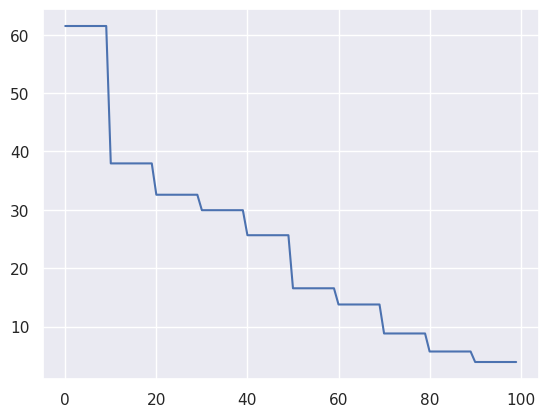

In [9]:
sampled_params_df.starting_bathymetry_mae.plot()

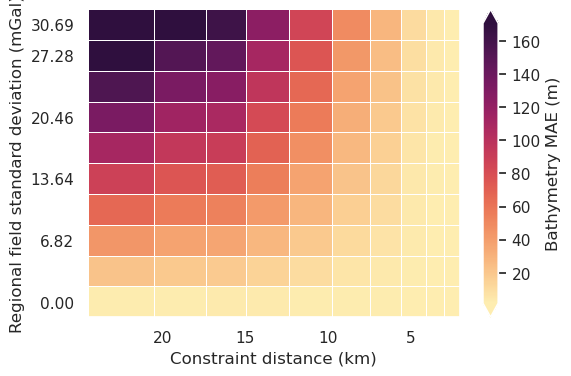

In [10]:
fig = RIS_plotting.plot_2var_ensemble(
    sampled_params_df,
    figsize=(6, 4),
    x="constraint_spacing",
    x_title="Constraint distance (km)",
    # x="constraint_numbers",
    # x_title="Number of constraints",
    # x="constraints_per_10000sq_km",
    # x_title="Constraints per $10000 km^2$",
    y="regional_stdev",
    y_title="Regional field standard deviation (mGal)",
    background="inversion_mae",
    background_title="Bathymetry MAE (m)",
    # plot_title="Constraint spacing vs regional strength",
    background_robust=True,
    # logx=True,
    flipx=True,
)

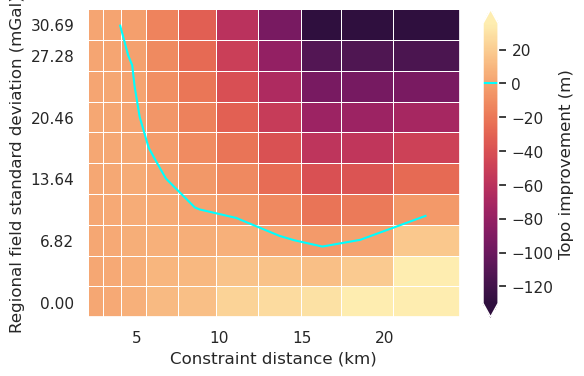

In [16]:
fig = RIS_plotting.plot_2var_ensemble(
    sampled_params_df,  # [sampled_params_df.constraint_numbers > 2],
    figsize=(6, 4),
    x="constraint_spacing",
    x_title="Constraint distance (km)",
    # x="constraint_numbers",
    # x_title="Number of constraints",
    # x="constraints_per_10000sq_km",
    # x_title="Constraints per $10000 km^2$",
    y="regional_stdev",
    y_title="Regional field standard deviation (mGal)",
    background="topo_improvement_mae",
    background_title="Topo improvement (m)",
    background_cmap="cmo.matter_r",
    background_robust=True,
    # background_cpt_lims=(-10, 10),
    plot_contours=[0],
    contour_color="cyan",
    # plot_title="Constraint spacing vs regional strength",
    # logx=True,
)

# ax = fig.get_axes()[0]

# bbox = dict(facecolor="lightgray", boxstyle="round")
# plt.gcf().text(0.1, 0.9, "b)", fontsize=16, va="bottom", ha="right")

# # specify x ticks
# ax = fig.get_axes()[0]
# ax.grid(True)
# vals = list(sampled_params_df.constraints_per_10000sq_km.unique()[::2])
# vals.append(sampled_params_df.constraints_per_10000sq_km.unique()[-1])
# ax.set_xticks(vals)
# ax.set_xticklabels([round(x) for x in vals])
# ax.tick_params(
#     axis='both', which='both', length=5, bottom=True, left=True,
# )

# # specify y ticks
# yvals = list(sampled_params_df.regional_stdev.unique()[::2])
# yvals.append(sampled_params_df.regional_stdev.unique()[-1])
# ax.set_yticks(yvals)
# ax.set_yticklabels([round(x) for x in yvals])
# ax.tick_params(
#     axis='both', which='both', length=5, bottom=True, left=True,
# )

# ax2 = ax.twiny()
# ax2.set_xticks(vals)
# vals = [round(x) for x in sampled_params_df.constraint_spacing.unique()][::2]
# vals.append(round(sampled_params_df.constraint_spacing.unique()[-1]))
# ax2.set_xticklabels(vals)
# ax2.xaxis.set_ticks_position("bottom")
# ax2.xaxis.set_label_position("bottom")
# ax2.spines["bottom"].set_position(("outward", 40))
# ax2.set_xlim(ax.get_xlim())
# ax2.grid(False)
# ax2.set_xlabel("Constraints distance (km)")

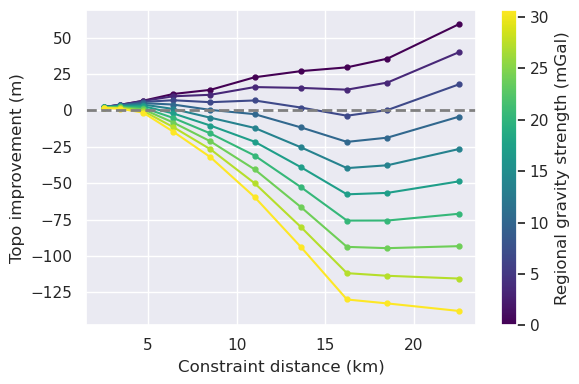

In [13]:
fig = RIS_plotting.plot_ensemble_as_lines(
    sampled_params_df,  # [sampled_params_df.constraint_numbers>2],
    figsize=(6, 4),
    x="constraint_spacing",
    x_label="Constraint distance (km)",
    # x="constraints_per_10000sq_km",
    # x_label="Constraints per $10000 km^2$",
    y="topo_improvement_mae",
    y_label="Topo improvement (m)",
    groupby_col="regional_stdev",
    cbar_label="Regional gravity strength (mGal)",
    # trend_line=True,
    horizontal_line=0,
    # horizontal_line_label="Starting RMSE",
    # slope_min_max=True,
    # slope_mean=True,
    # logx=True,
)

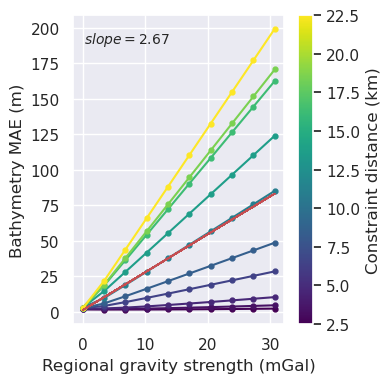

In [14]:
fig = RIS_plotting.plot_ensemble_as_lines(
    sampled_params_df,  # [sampled_params_df.constraint_numbers>2],
    figsize=(4, 4),
    x="regional_stdev",
    x_label="Regional gravity strength (mGal)",
    y="inversion_mae",
    y_label="Bathymetry MAE (m)",
    groupby_col="constraint_spacing",
    cbar_label="Constraint distance (km)",
    # groupby_col="constraints_per_10000sq_km",
    # cbar_label="Constraints per $10000 km^2$",
    trend_line=True,
    # horizontal_line=starting_bathymetry_rmse,
    # horizontal_line_label="Starting RMSE",
    # slope_min_max=True,
    # slope_mean=True,
)

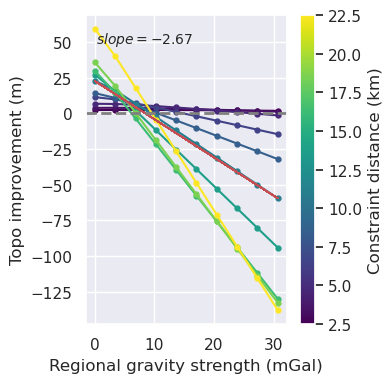

In [15]:
fig = RIS_plotting.plot_ensemble_as_lines(
    sampled_params_df,  # [sampled_params_df.constraint_numbers>2],
    figsize=(4, 4),
    x="regional_stdev",
    x_label="Regional gravity strength (mGal)",
    y="topo_improvement_mae",
    y_label="Topo improvement (m)",
    groupby_col="constraint_spacing",
    cbar_label="Constraint distance (km)",
    # groupby_col="constraints_per_10000sq_km",
    # cbar_label="Constraints per $10000 km^2$",
    trend_line=True,
    horizontal_line=0,
    # horizontal_line_label="Starting RMSE",
    # slope_min_max=True,
    # slope_mean=True,
)